In [1]:
import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping
import os
from glob import glob

# Define paths
input_dir = '/content/drive/MyDrive/Architecture_20250102/Architecture/3rd/3rd/backR_In'
target_dir = '/content/drive/MyDrive/Architecture_20250102/Architecture/3rd/3rd/backR_Ou'
img_size = (256, 256)
checkpoint_dir = "/content/drive/MyDrive/Architecture_20250102/Architecture/Checkpoints"
os.makedirs(checkpoint_dir, exist_ok=True)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

MessageError: Error: credential propagation was unsuccessful

In [2]:
# Helper function to load and preprocess images
def load_image(file_path, target=False):
    img = tf.io.read_file(file_path)
    img = tf.image.decode_png(img, channels=3)
    img = tf.image.resize(img, img_size)
    img = tf.cast(img, tf.float32) / 127.5 - 1  # Normalize to [-1, 1]
    return img

# Prepare Dataset
def prepare_dataset(input_dir, target_dir, batch_size):
    input_paths = sorted(glob(os.path.join(input_dir, '*.png')))
    target_paths = sorted(glob(os.path.join(target_dir, '*.png')))

    input_ds = tf.data.Dataset.from_tensor_slices(input_paths).map(lambda x: load_image(x), num_parallel_calls=tf.data.AUTOTUNE)
    target_ds = tf.data.Dataset.from_tensor_slices(target_paths).map(lambda x: load_image(x), num_parallel_calls=tf.data.AUTOTUNE)

    dataset = tf.data.Dataset.zip((input_ds, target_ds))
    dataset = dataset.shuffle(100).batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset


In [3]:
# Build generator with L2 regularization
def build_generator():
    inputs = Input(shape=(256, 256, 3))
    reg = l2(1e-4)

    # Downsampling
    d1 = Conv2D(64, 4, strides=2, padding='same', kernel_regularizer=reg)(inputs)
    d1 = LeakyReLU(0.2)(d1)

    d2 = Conv2D(128, 4, strides=2, padding='same', kernel_regularizer=reg)(d1)
    d2 = BatchNormalization()(d2)
    d2 = LeakyReLU(0.2)(d2)

    d3 = Conv2D(256, 4, strides=2, padding='same', kernel_regularizer=reg)(d2)
    d3 = BatchNormalization()(d3)
    d3 = LeakyReLU(0.2)(d3)

    d4 = Conv2D(512, 4, strides=2, padding='same', kernel_regularizer=reg)(d3)
    d4 = BatchNormalization()(d4)
    d4 = LeakyReLU(0.2)(d4)

    # Bottleneck
    b = Conv2D(512, 4, strides=2, padding='same', kernel_regularizer=reg)(d4)
    b = Activation('relu')(b)

    # Upsampling
    u1 = Conv2DTranspose(512, 4, strides=2, padding='same', kernel_regularizer=reg)(b)
    u1 = BatchNormalization()(u1)
    u1 = Dropout(0.5)(u1)
    u1 = Concatenate()([u1, d4])

    u2 = Conv2DTranspose(256, 4, strides=2, padding='same', kernel_regularizer=reg)(u1)
    u2 = BatchNormalization()(u2)
    u2 = Dropout(0.5)(u2)
    u2 = Concatenate()([u2, d3])

    u3 = Conv2DTranspose(128, 4, strides=2, padding='same', kernel_regularizer=reg)(u2)
    u3 = BatchNormalization()(u3)
    u3 = Dropout(0.5)(u3)
    u3 = Concatenate()([u3, d2])

    u4 = Conv2DTranspose(64, 4, strides=2, padding='same', kernel_regularizer=reg)(u3)
    u4 = BatchNormalization()(u4)
    u4 = Dropout(0.5)(u4)
    u4 = Concatenate()([u4, d1])

    outputs = Conv2DTranspose(3, 4, strides=2, padding='same', activation='tanh')(u4)

    return Model(inputs, outputs)

# Build discriminator with L2 regularization
def build_discriminator():
    inputs = Input(shape=(256, 256, 3))
    targets = Input(shape=(256, 256, 3))
    reg = l2(1e-4)

    combined = Concatenate()([inputs, targets])

    d1 = Conv2D(64, 4, strides=2, padding='same', kernel_regularizer=reg)(combined)
    d1 = LeakyReLU(0.2)(d1)

    d2 = Conv2D(128, 4, strides=2, padding='same', kernel_regularizer=reg)(d1)
    d2 = BatchNormalization()(d2)
    d2 = LeakyReLU(0.2)(d2)

    d3 = Conv2D(256, 4, strides=2, padding='same', kernel_regularizer=reg)(d2)
    d3 = BatchNormalization()(d3)
    d3 = LeakyReLU(0.2)(d3)

    d4 = Conv2D(512, 4, strides=2, padding='same', kernel_regularizer=reg)(d3)
    d4 = BatchNormalization()(d4)
    d4 = LeakyReLU(0.2)(d4)

    outputs = Conv2D(1, kernel_size=4, strides=1, padding='same')(d4)

    return Model([inputs, targets], outputs)

# Loss functions
def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.keras.losses.MeanAbsoluteError()(target, gen_output)
    total_gen_loss = gan_loss + (100 * l1_loss)
    return total_gen_loss

def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss


In [4]:

# Prepare dataset
BATCH_SIZE = 16
train_dataset = prepare_dataset(input_dir, target_dir, BATCH_SIZE)

dataset_size = tf.data.experimental.cardinality(train_dataset).numpy()
val_split = int(dataset_size * 0.2)
val_dataset = train_dataset.take(val_split)
train_dataset = train_dataset.skip(val_split)

# Initialize models
generator = build_generator()
discriminator = build_discriminator()

# Optimizers
generator_optimizer = Adam(2e-4, beta_1=0.5)
discriminator_optimizer = Adam(2e-4, beta_1=0.5)

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training loop
EPOCHS = 2800
CHECKPOINT_INTERVAL = 10
start_epoch = 2600
checkpoint = tf.train.Checkpoint(generator=generator, discriminator=discriminator)
checkpoint_manager = tf.train.CheckpointManager(checkpoint, checkpoint_dir, max_to_keep=3)


In [ ]:
for epoch in range(start_epoch, EPOCHS):
    for input_image, target in train_dataset:
        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            gen_output = generator(input_image, training=True)
            disc_real_output = discriminator([input_image, target], training=True)
            disc_generated_output = discriminator([input_image, gen_output], training=True)

            gen_loss = generator_loss(disc_generated_output, gen_output, target)
            disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

        generator_gradients = gen_tape.gradient(gen_loss, generator.trainable_variables)
        discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

        generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
        discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

    # Save checkpoints periodically
    if (epoch + 1) % CHECKPOINT_INTERVAL == 0:
        checkpoint_manager.save()
        print(f"Checkpoint saved at epoch {epoch + 1}")

    # Print progress
    print(f"Epoch: {epoch + 1}, Generator Loss: {gen_loss.numpy()}, Discriminator Loss: {disc_loss.numpy()}")

# Save final models
generator.save(os.path.join(checkpoint_dir, '/content/drive/MyDrive/Architecture_20250102/Architecture/Generated_Model3/generator_final_epochs2800.h5'))
discriminator.save(os.path.join(checkpoint_dir, '/content/drive/MyDrive/Architecture_20250102/Architecture/Generated_Model3/discriminator_final_epochs2800.h5'))

print("Training complete.")


In [ ]:
for epoch in range(start_epoch, EPOCHS):
    for input_image, target in train_dataset:
        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            gen_output = generator(input_image, training=True)
            disc_real_output = discriminator([input_image, target], training=True)
            disc_generated_output = discriminator([input_image, gen_output], training=True)

            gen_loss = generator_loss(disc_generated_output, gen_output, target)
            disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

        generator_gradients = gen_tape.gradient(gen_loss, generator.trainable_variables)
        discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

        generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
        discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

    # Save checkpoints at desired intervals
    if (epoch + 1) % 200 == 0:  # Save every 200 epochs
        generator.save(os.path.join(checkpoint_dir, f'/content/drive/MyDrive/Architecture_20250102/Architecture/Generated_Model3/generator_final_epochs{epoch + 1}.keras'))
        discriminator.save(os.path.join(checkpoint_dir, f'/content/drive/MyDrive/Architecture_20250102/Architecture/Generated_Model3/discriminator_final_epochs{epoch + 1}.keras'))
        print(f"Models saved at epoch {epoch + 1}")

    #Save checkpoints periodically
    if (epoch + 1) % CHECKPOINT_INTERVAL == 0:
        checkpoint_manager.save()
        print(f"Checkpoint saved at epoch {epoch + 1}")

    # Print progress
    print(f"Epoch: {epoch + 1}, Generator Loss: {gen_loss.numpy()}, Discriminator Loss: {disc_loss.numpy()}")

# Save final models
generator.save(os.path.join(checkpoint_dir, '/content/drive/MyDrive/Architecture_20250102/Architecture/Generated_Model3/generator_final_epochs3000.keras'))
discriminator.save(os.path.join(checkpoint_dir, '/content/drive/MyDrive/Architecture_20250102/Architecture/Generated_Model3/discriminator_final_epochs3000.keras'))

print("Training complete.")


Epoch: 2536, Generator Loss: 48.57945251464844, Discriminator Loss: 0.657145619392395
Epoch: 2537, Generator Loss: 30.145633697509766, Discriminator Loss: 0.4349915087223053
Epoch: 2538, Generator Loss: 22.075439453125, Discriminator Loss: 0.26796096563339233
Epoch: 2539, Generator Loss: 17.155229568481445, Discriminator Loss: 2.1810479164123535
Checkpoint saved at epoch 2540
Epoch: 2540, Generator Loss: 14.086483001708984, Discriminator Loss: 0.29617518186569214
Epoch: 2541, Generator Loss: 12.461795806884766, Discriminator Loss: 0.17671296000480652
Epoch: 2542, Generator Loss: 12.00947093963623, Discriminator Loss: 0.1685676872730255
Epoch: 2543, Generator Loss: 10.238057136535645, Discriminator Loss: 0.19114483892917633
Epoch: 2544, Generator Loss: 9.504523277282715, Discriminator Loss: 0.3452538251876831
Epoch: 2545, Generator Loss: 9.207335472106934, Discriminator Loss: 0.0978795737028122
Epoch: 2546, Generator Loss: 8.381508827209473, Discriminator Loss: 0.12864699959754944
Epoch

generator


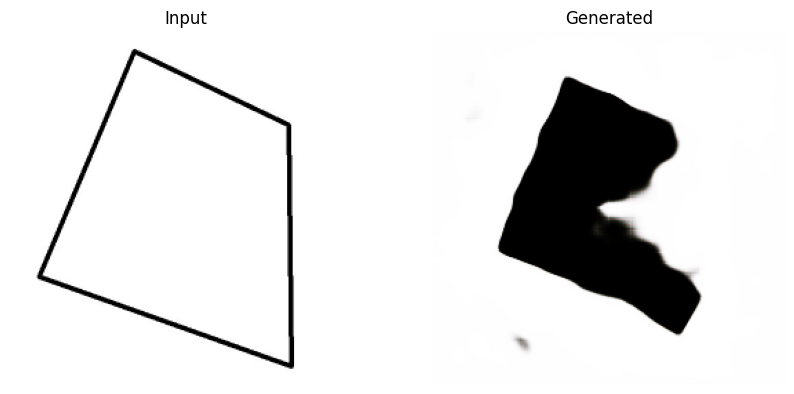

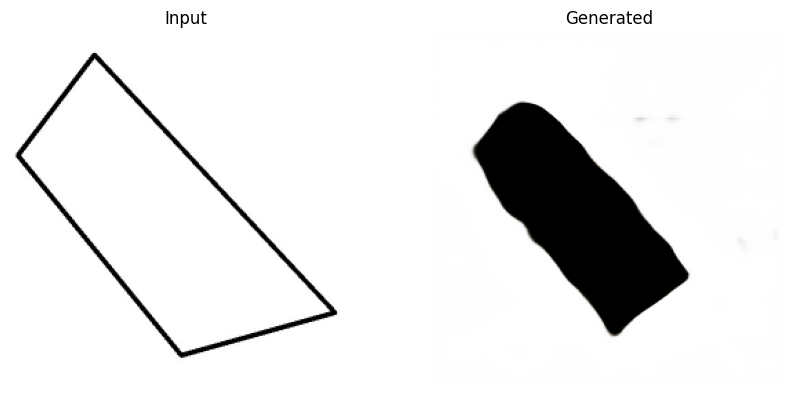

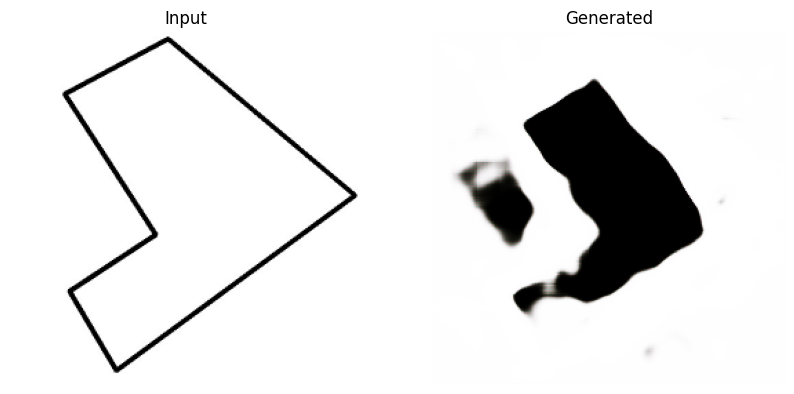

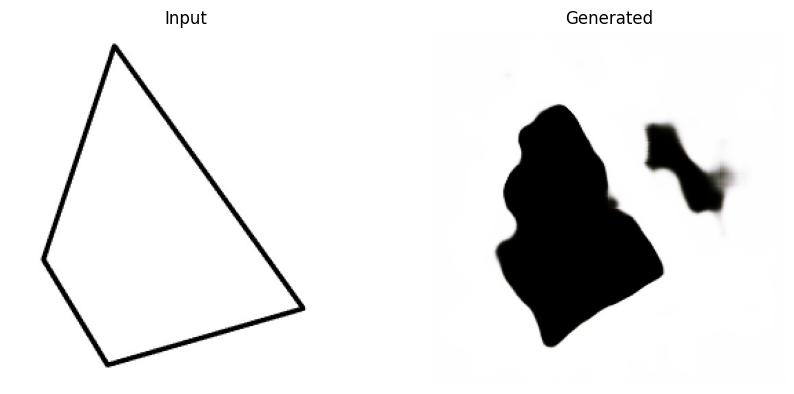

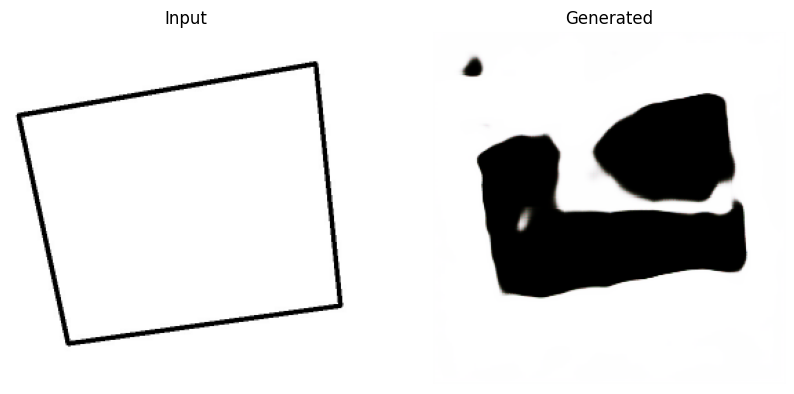

...

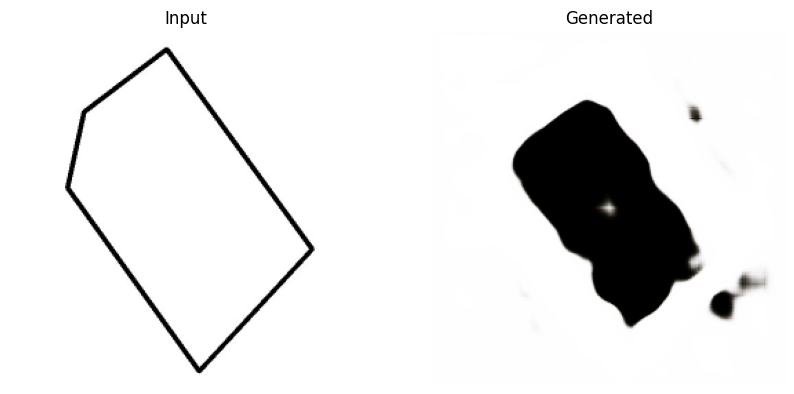

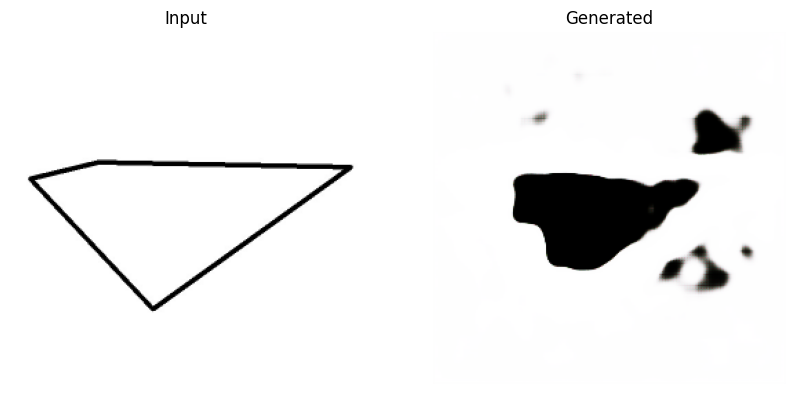

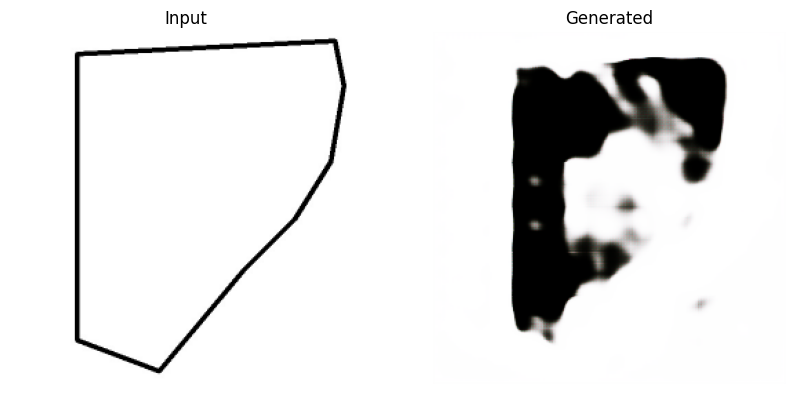

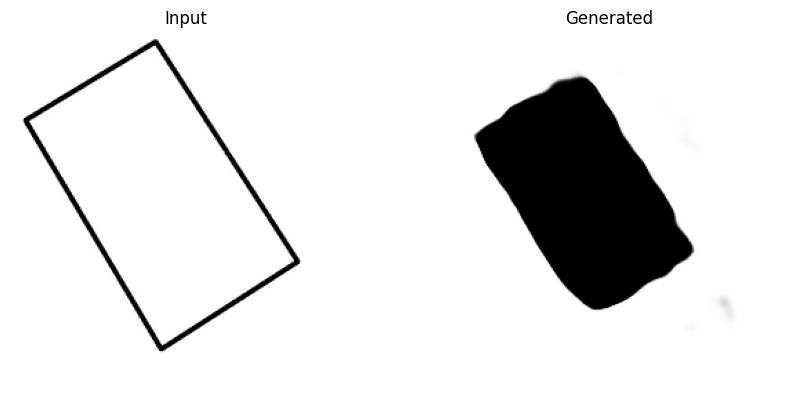

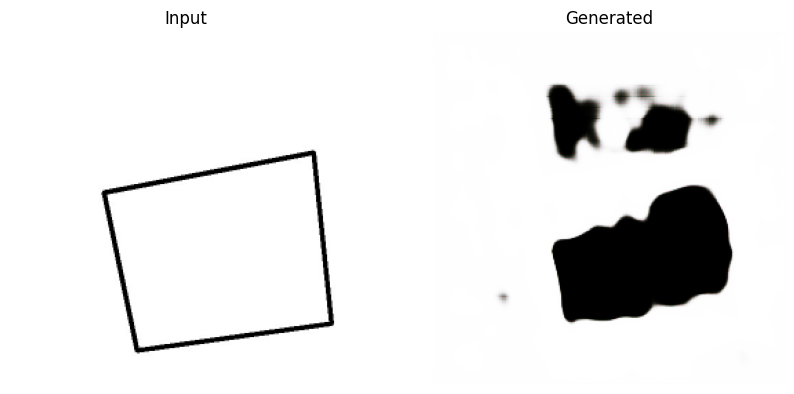

Generated outputs are saved to /content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/2800_without_dataset_output.


In [ ]:
import tensorflow as tf
import os
import matplotlib.pyplot as plt

# Paths to the saved model and test data
generator_model_path = "/content/drive/MyDrive/Architecture_20250102/Architecture/Generated_Model3/generator_final_epochs2800.keras"
test_input_dir = "/content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/TestingParcel/testImafge"
output_dir = "/content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/2800_without_dataset_output"
img_size = (256, 256)
os.makedirs(output_dir, exist_ok=True)

# Helper function to load and preprocess test images
def load_test_image(file_path):
    img = tf.io.read_file(file_path)
    img = tf.image.decode_png(img, channels=3)
    img = tf.image.resize(img, img_size)
    img = tf.cast(img, tf.float32) / 127.5 - 1  # Normalize to [-1, 1]
    #print("load_test_image")
    return img

# Load generator model
generator = tf.keras.models.load_model(generator_model_path)
print("generator")

# Load test images
test_input_paths = sorted([os.path.join(test_input_dir, fname) for fname in os.listdir(test_input_dir) if fname.endswith('.png')])
test_inputs = [load_test_image(path) for path in test_input_paths]
test_dataset = tf.data.Dataset.from_tensor_slices(test_inputs).batch(1)

# Function to denormalize image from [-1, 1] to [0, 255]
def denormalize_image(img):
    img = (img + 1) * 127.5
    return tf.cast(img, tf.uint8)

# Generate and save outputs
for i, input_image in enumerate(test_dataset):
    generated_image = generator(input_image, training=False)
    output_image = denormalize_image(generated_image[0])

    # Save output image
    output_path = os.path.join(output_dir, f"output_{i+1}.png")
    tf.keras.preprocessing.image.save_img(output_path, output_image)

    # Display input and generated images
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title("Input")
    plt.imshow(denormalize_image(input_image[0]).numpy())
    plt.axis("off")
    plt.subplot(1, 2, 2)
    plt.title("Generated")
    plt.imshow(output_image.numpy())
    plt.axis("off")
    plt.show()

print(f"Generated outputs are saved to {output_dir}.")


generator


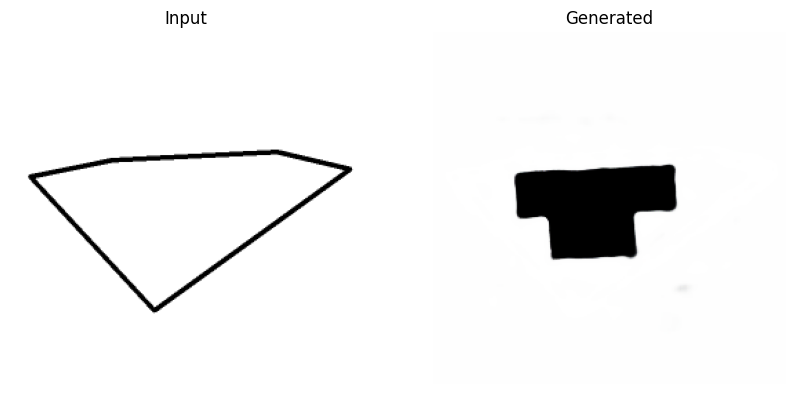

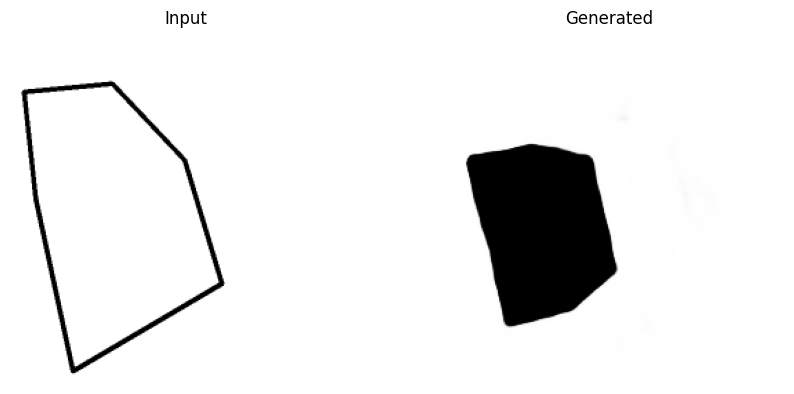

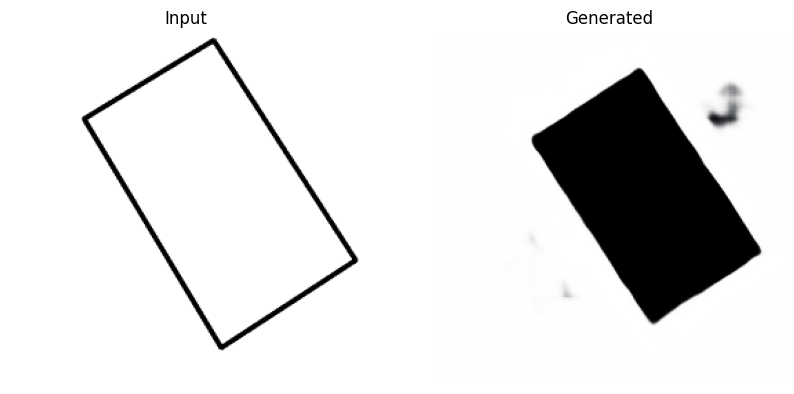

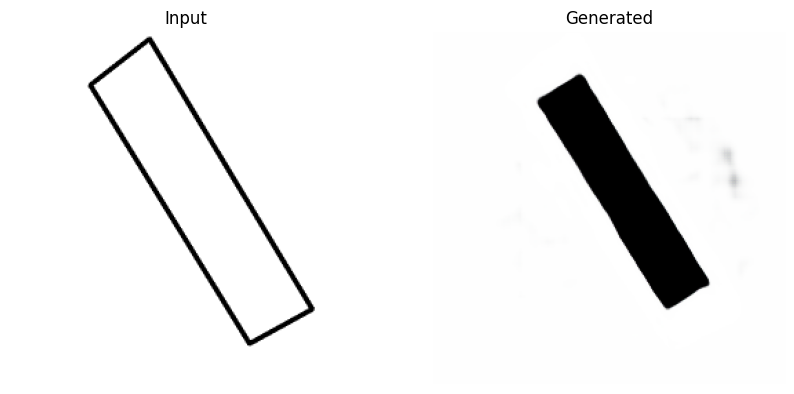

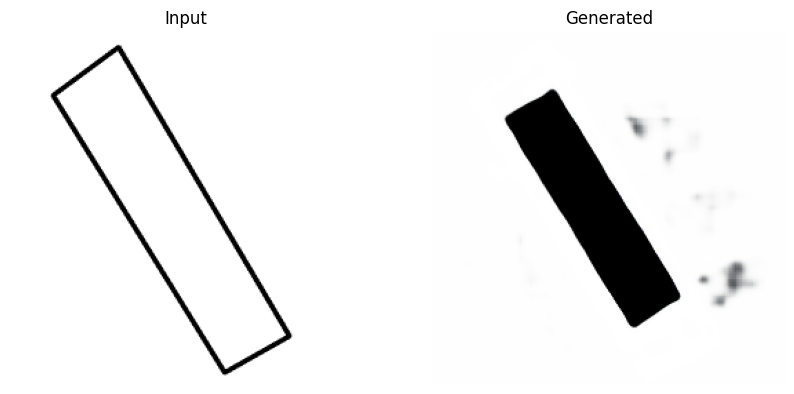

...

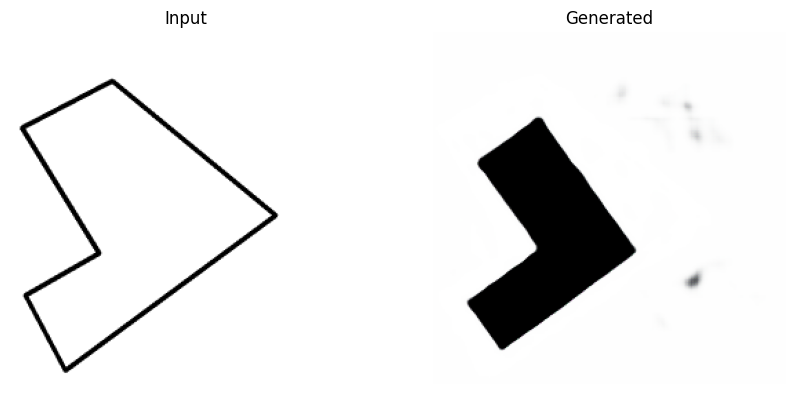

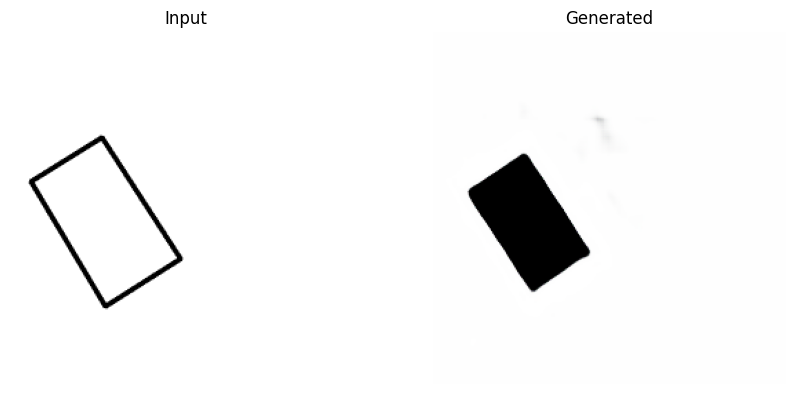

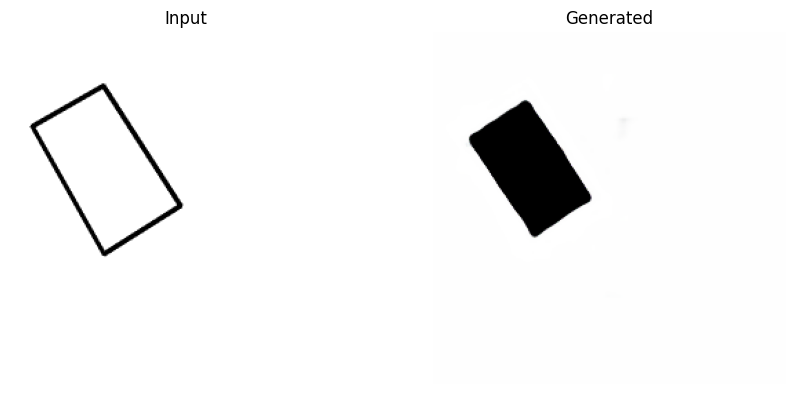

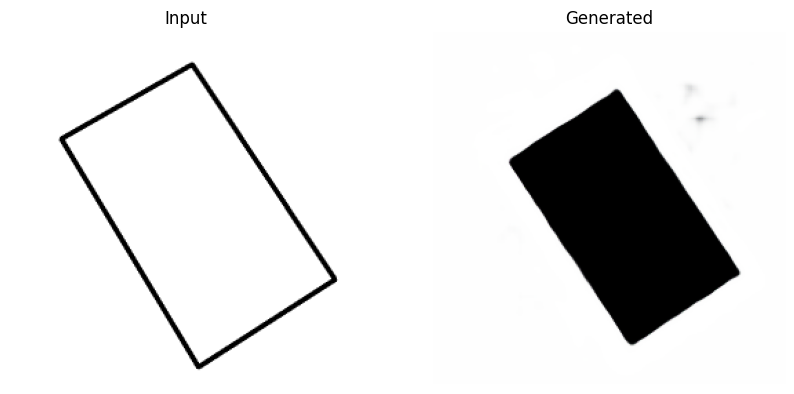

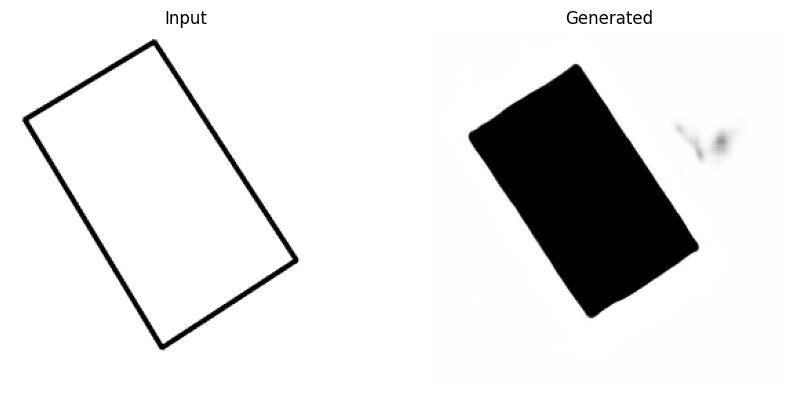

NameError: name 'output_dir' is not defined

In [3]:
import tensorflow as tf
import os
import matplotlib.pyplot as plt

# Paths to the saved model and test data
generator_model_path = "/content/drive/MyDrive/Architecture_20250102/Architecture/Generated_Model3/generator_final_epochs2000.keras"
test_input_dir = "/content/drive/MyDrive/Architecture_20250102/Architecture/3rd/3rd/backR_In"
#output_dir = "/content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/2000_withinOutput"
img_size = (256, 256)
#os.makedirs(output_dir, exist_ok=True)

# Helper function to load and preprocess test images
def load_test_image(file_path):
    img = tf.io.read_file(file_path)
    img = tf.image.decode_png(img, channels=3)
    img = tf.image.resize(img, img_size)
    img = tf.cast(img, tf.float32) / 127.5 - 1  # Normalize to [-1, 1]
    #print("load_test_image")
    return img

# Load generator model
generator = tf.keras.models.load_model(generator_model_path)
print("generator")

# Load test images
test_input_paths = sorted([os.path.join(test_input_dir, fname) for fname in os.listdir(test_input_dir) if fname.endswith('.png')])
test_inputs = [load_test_image(path) for path in test_input_paths]
test_dataset = tf.data.Dataset.from_tensor_slices(test_inputs).batch(1)

# Function to denormalize image from [-1, 1] to [0, 255]
def denormalize_image(img):
    img = (img + 1) * 127.5
    return tf.cast(img, tf.uint8)

# Generate and save outputs
for i, input_image in enumerate(test_dataset):
    generated_image = generator(input_image, training=False)
    output_image = denormalize_image(generated_image[0])

    # Save output image
    # output_path = os.path.join(output_dir, f"output_{i+1}.png")
    # tf.keras.preprocessing.image.save_img(output_path, output_image)

    # Display input and generated images
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title("Input")
    plt.imshow(denormalize_image(input_image[0]).numpy())
    plt.axis("off")
    plt.subplot(1, 2, 2)
    plt.title("Generated")
    plt.imshow(output_image.numpy())
    plt.axis("off")
    plt.show()

print(f"Generated outputs are saved to {output_dir}.")


In [ ]:
!pip install tensorflowjs


INFO: pip is looking at multiple versions of tf-keras to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 58.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 615.3/615.3 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 62.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 86.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 92.5 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 24.2
    Uninstalling packaging-24.2:
      Successfully uninstalled packaging-24.2
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.17.1
    Uninstalling tensorboard-2.17.1:
      Successfully unin

In [ ]:
!tensorflowjs_converter --input_format=keras /content/drive/MyDrive/Architecture_20250102/Architecture/trainedModel/generator_epoch_600.h5 /content/drive/MyDrive/Architecture_20250102/Architecture/Generated_Model3/tfjs_model

2025-01-03 08:24:11.967839: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1735892651.993453    1551 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1735892652.000886    1551 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-03 08:24:12.025884: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
🌲 Try https://ydf.readthedocs.io, the successor of TensorFlow Decision Forests with more features and faster training!
failed

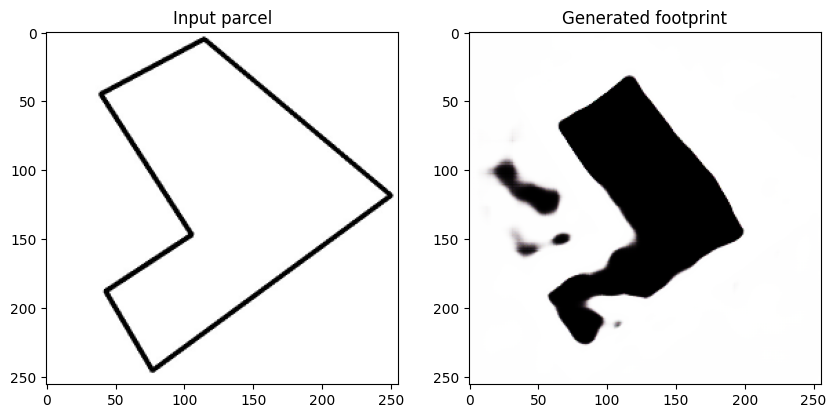

In [ ]:
import os
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import load_model

# Paths to the generator and test image
generator_path = r'/content/drive/MyDrive/Architecture_20250102/Architecture/Generated_Model3/generator_final_epochs1400.keras'  # Update path as needed
test_image_path = r'/content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/TestingParcel/testImafge/testingImage11.png'  # Update path as needed

# Load the pre-trained generator
generator = load_model(generator_path, compile=False)

# Function to preprocess the test image
def preprocess_image(image_path):
    """
    Load and preprocess a test image for the generator.
    """
    img = tf.io.read_file(image_path)
    img = tf.image.decode_png(img, channels=3)  # Adjust channels as needed
    img = tf.image.resize(img, [256, 256])  # Resize to match the model's input size
    img = (tf.cast(img, tf.float32) / 127.5) - 1  # Normalize to [-1, 1]
    return img

# Preprocess the test image
input_image = preprocess_image(test_image_path)

# Add a batch dimension for the generator
input_image = tf.expand_dims(input_image, axis=0)

# Generate room split using the pre-trained model
predicted_split = generator(input_image, training=False)

# # Save the input and output images
#input_save_path = '/content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/TestingParcel/testingImage2.jpg'
output_save_path = '/content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/without_Dataset_testedOutput/testedImage11_1400.png'

# tf.keras.preprocessing.image.save_img(
#     input_save_path, (input_image[0] + 1) * 127.5  # Convert back to [0, 255] range
# )
tf.keras.preprocessing.image.save_img(
    output_save_path, (predicted_split[0] + 1) * 127.5  # Convert back to [0, 255] range
)


# Display the input and output images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Input parcel")
plt.imshow((input_image[0] + 1) / 2)  # De-normalize to [0, 1] range

plt.subplot(1, 2, 2)
plt.title("Generated footprint")
plt.imshow((predicted_split[0] + 1) / 2)  # De-normalize to [0, 1] range


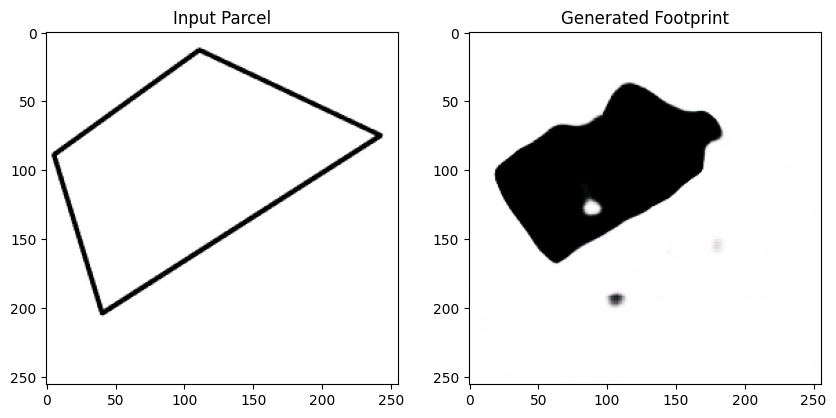

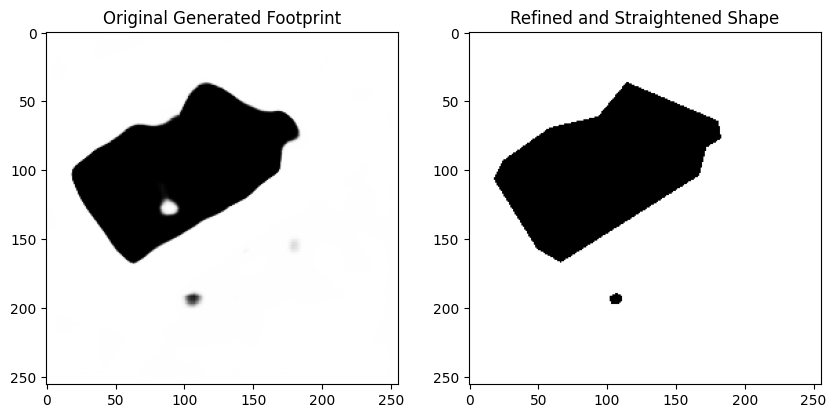

Refined footprint saved at: /content/drive/MyDrive/train/test/refined_footprint.png


In [ ]:
import os
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import load_model
import cv2
import numpy as np

# Paths to the generator and test image
generator_path = r'/content/drive/MyDrive/Architecture_20250102/Architecture/Generated_Model3/generator_final_epochs1000.keras'  # Update path as needed
test_image_path = r'/content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/TestingParcel/testImafge/testingImage15.png'  # Update path as needed

# Load the pre-trained generator
generator = load_model(generator_path, compile=False)

# Function to preprocess the test image
def preprocess_image(image_path):
    """
    Load and preprocess a test image for the generator.
    """
    img = tf.io.read_file(image_path)
    img = tf.image.decode_png(img, channels=3)  # Adjust channels as needed
    img = tf.image.resize(img, [256, 256])  # Resize to match the model's input size
    img = (tf.cast(img, tf.float32) / 127.5) - 1  # Normalize to [-1, 1]
    return img

# Preprocess the test image
input_image = preprocess_image(test_image_path)

# Add a batch dimension for the generator
input_image = tf.expand_dims(input_image, axis=0)

# Generate room split using the pre-trained model
predicted_split = generator(input_image, training=False)

# Save the generated footprint for further processing
output_save_path = '/content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/Surveys/FinalOutput/generated_footprint_temp.png'
tf.keras.preprocessing.image.save_img(
    output_save_path, (predicted_split[0] + 1) * 127.5  # Convert back to [0, 255] range
)

# Display the input and output images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Input Parcel")
plt.imshow((input_image[0] + 1) / 2)  # De-normalize to [0, 1] range

plt.subplot(1, 2, 2)
plt.title("Generated Footprint")
plt.imshow((predicted_split[0] + 1) / 2)  # De-normalize to [0, 1] range
plt.show()

# ------------------ Shape Refinement Part ------------------ #
# Load the saved generated footprint
image_path = output_save_path  # Path to the generated footprint
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Check if image loaded successfully
if img is None:
    print(f"Error: Could not load image from {image_path}. Check the file path and permissions.")
else:
    # Step 1: Apply Gaussian Blur to reduce noise
    blurred = cv2.GaussianBlur(img, (5, 5), 0)

    # Step 2: Thresholding to make the shape distinct
    _, thresholded = cv2.threshold(blurred, 127, 255, cv2.THRESH_BINARY_INV)

    # Step 3: Morphological operations to improve shape clarity
    kernel = np.ones((5, 5), np.uint8)
    closed = cv2.morphologyEx(thresholded, cv2.MORPH_CLOSE, kernel)

    # Step 4: Use Canny edge detection to highlight the edges
    edges = cv2.Canny(closed, 50, 150)

    # Step 5: Find contours based on the edges
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Step 6: Draw simplified, straighter contours on a blank canvas
    sharp_image = np.zeros_like(img)
    for contour in contours:
        # Approximate the contour to a polygon to straighten lines
        epsilon = 0.01 * cv2.arcLength(contour, True)  # Adjust 0.01 for more or less smoothing
        approx = cv2.approxPolyDP(contour, epsilon, True)
        cv2.drawContours(sharp_image, [approx], -1, (255), thickness=cv2.FILLED)

    # Invert the sharp image to get black shape on white background
    final_image = cv2.bitwise_not(sharp_image)

    # Display the original and processed images
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title("Original Generated Footprint")
    plt.imshow(img, cmap='gray')

    plt.subplot(1, 2, 2)
    plt.title("Refined and Straightened Shape")
    plt.imshow(final_image, cmap='gray')
    plt.show()

    # Save the refined shape
    refined_output_path = '/content/drive/MyDrive/train/test/refined_footprint.png'
    cv2.imwrite(refined_output_path, final_image)
    print(f"Refined footprint saved at: {refined_output_path}")


refine the shape

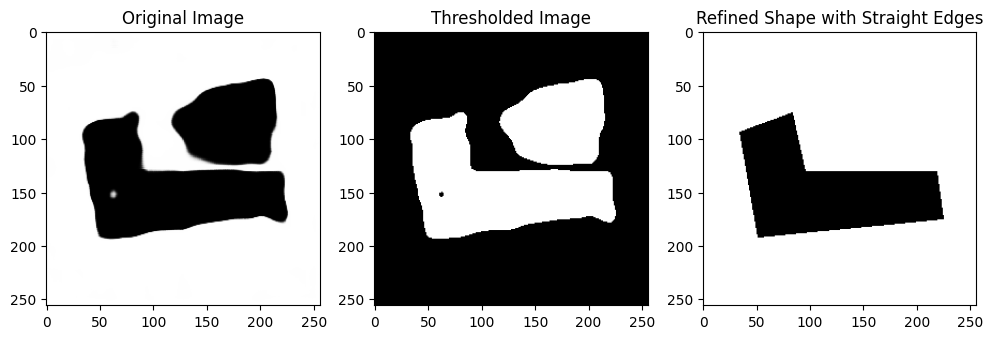

Refined shape with straight edges saved at: /content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/Surveys/FinalOutput/refined_shape_with_straight_edges.png


In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Path to the input image
image_path = "/content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/withoutdatasetoutput2/output_5.png"  # Replace with your uploaded image path

# Load the image in grayscale
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Check if the image is loaded successfully
if img is None:
    print(f"Error: Could not load image from {image_path}. Check the file path and permissions.")
else:
    # Step 1: Apply Gaussian Blur to reduce noise
    blurred = cv2.GaussianBlur(img, (5, 5), 0)

    # Step 2: Threshold the image to get a binary mask
    _, thresholded = cv2.threshold(blurred, 127, 255, cv2.THRESH_BINARY_INV)

    # Step 3: Find contours
    contours, _ = cv2.findContours(thresholded, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Step 4: Find the largest contour (assuming the footprint is the largest shape)
    largest_contour = max(contours, key=cv2.contourArea)

    # Step 5: Approximate the contour to make the edges straight
    epsilon = 0.01 * cv2.arcLength(largest_contour, True)  # Adjust the epsilon value for more or fewer straight lines
    approx = cv2.approxPolyDP(largest_contour, epsilon, True)

    # Step 6: Create a blank mask to draw the straightened polygon
    refined_mask = np.zeros_like(img)
    cv2.fillPoly(refined_mask, [approx], 255)  # Fill the polygon with white

    # Step 7: Invert the refined mask to get black shape on a white background
    refined_shape = cv2.bitwise_not(refined_mask)

    # Display the original and processed images
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(img, cmap='gray')

    plt.subplot(1, 3, 2)
    plt.title("Thresholded Image")
    plt.imshow(thresholded, cmap='gray')

    plt.subplot(1, 3, 3)
    plt.title("Refined Shape with Straight Edges")
    plt.imshow(refined_shape, cmap='gray')

    plt.show()

    # Save the refined image
    refined_output_path = "/content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/Surveys/FinalOutput/refined_shape_with_straight_edges.png"
    cv2.imwrite(refined_output_path, refined_shape)
    print(f"Refined shape with straight edges saved at: {refined_output_path}")



<ipython-input-28-78fade0e272f>:30: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box = np.int0(box)  # Convert to integer


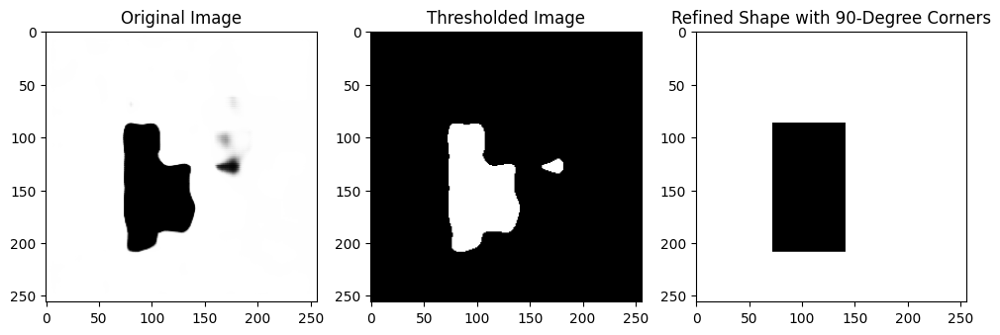

Refined shape with 90-degree corners saved at: /content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/Surveys/FinalOutput/refined_shape_with_90_degree_corners.png


In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Path to the input image
image_path = "/content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/withoutdatasetoutput2/output_8.png"  # Replace with your uploaded image path

# Load the image in grayscale
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Check if the image is loaded successfully
if img is None:
    print(f"Error: Could not load image from {image_path}. Check the file path and permissions.")
else:
    # Step 1: Apply Gaussian Blur to reduce noise
    blurred = cv2.GaussianBlur(img, (5, 5), 0)

    # Step 2: Threshold the image to get a binary mask
    _, thresholded = cv2.threshold(blurred, 127, 255, cv2.THRESH_BINARY_INV)

    # Step 3: Find contours
    contours, _ = cv2.findContours(thresholded, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Step 4: Find the largest contour (assuming the footprint is the largest shape)
    largest_contour = max(contours, key=cv2.contourArea)

    # Step 5: Approximate the contour with a rotated rectangle
    rect = cv2.minAreaRect(largest_contour)  # Get the rotated rectangle
    box = cv2.boxPoints(rect)  # Get the corners of the rectangle
    box = np.int0(box)  # Convert to integer

    # Step 6: Transform the rectangle to make all angles 90 degrees
    x_coords = box[:, 0]
    y_coords = box[:, 1]

    # Find the min and max coordinates to create a perfect rectangle
    x_min, x_max = np.min(x_coords), np.max(x_coords)
    y_min, y_max = np.min(y_coords), np.max(y_coords)

    # Create a rectilinear box with 90-degree corners
    rectilinear_box = np.array([
        [x_min, y_min],
        [x_max, y_min],
        [x_max, y_max],
        [x_min, y_max]
    ], dtype=np.int32)

    # Step 7: Create a blank mask to draw the rectilinear polygon
    refined_mask = np.zeros_like(img)
    cv2.fillPoly(refined_mask, [rectilinear_box], 255)  # Fill the rectangle with white

    # Step 8: Invert the refined mask to get black shape on a white background
    refined_shape = cv2.bitwise_not(refined_mask)

    # Display the original and processed images
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(img, cmap='gray')

    plt.subplot(1, 3, 2)
    plt.title("Thresholded Image")
    plt.imshow(thresholded, cmap='gray')

    plt.subplot(1, 3, 3)
    plt.title("Refined Shape with 90-Degree Corners")
    plt.imshow(refined_shape, cmap='gray')

    plt.show()

    # Save the refined image
    refined_output_path = "/content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/Surveys/FinalOutput/refined_shape_with_90_degree_corners.png"
    cv2.imwrite(refined_output_path, refined_shape)
    print(f"Refined shape with 90-degree corners saved at: {refined_output_path}")


*Background Remove Code*

In [ ]:
import cv2
import numpy as np
import os

# Specify a single image file
image_path = "/content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/TestingParcel/testedImage1.jpg"
output_path = "/content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/TestingParcel/BRImageoutput_image.png"

# Load and process the image as before
image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)

if image is None:
    print("Error: Image not loaded. Check the file path.")
else:
    # Proceed with processing (same as in your original code)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, mask = cv2.threshold(gray, 240, 255, cv2.THRESH_BINARY)
    mask_inv = cv2.bitwise_not(mask)
    image_bgra = cv2.cvtColor(image, cv2.COLOR_BGR2BGRA)
    image_bgra[:, :, 3] = mask_inv
    cv2.imwrite(output_path, image_bgra)
    print(f"Processed and saved: {output_path}")


Processed and saved: /content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/TestingParcel/BRImageoutput_image.png


jpg to png

In [ ]:
import cv2
import os

# Specify the folder containing JPG images
input_folder = "/content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/TestingParcel/testImafge"  # Replace with your folder path
output_folder = "/content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/TestingParcel/testImafge"  # Replace with your desired output folder path

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Process each file in the folder
for filename in os.listdir(input_folder):
    # Full path to the image
    input_image_path = os.path.join(input_folder, filename)

    # Check if the file is a JPG image
    if filename.lower().endswith('.jpg'):
        # Load the JPG image
        image = cv2.imread(input_image_path, cv2.IMREAD_UNCHANGED)

        # Skip if the image could not be loaded
        if image is None:
            print(f"Warning: Unable to load {input_image_path}. Skipping...")
            continue

        # Define the output file path with a .png extension
        output_image_path = os.path.join(output_folder, os.path.splitext(filename)[0] + '.png')

        # Save the image as PNG
        cv2.imwrite(output_image_path, image)
        print(f"Converted and saved: {output_image_path}")

        # Delete the original JPG image
        try:
            os.remove(input_image_path)
            print(f"Deleted original JPG: {input_image_path}")
        except Exception as e:
            print(f"Error deleting file {input_image_path}: {e}")
    else:
        print(f"Skipping non-JPG file: {filename}")

print("Conversion and deletion complete!")



Converted and saved: /content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/TestingParcel/testImafge/testingImage1.png
Deleted original JPG: /content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/TestingParcel/testImafge/testingImage1.jpg
Converted and saved: /content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/TestingParcel/testImafge/testingImage2.png
Deleted original JPG: /content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/TestingParcel/testImafge/testingImage2.jpg
Converted and saved: /content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/TestingParcel/testImafge/testingImage3.png
Deleted original JPG: /content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/TestingParcel/testImafge/testingImage3.jpg
Converted and saved: /content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/TestingParcel/testImafge/testingImage5.png
Deleted original JPG: /content/drive/MyDrive/

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')


MessageError: Error: credential propagation was unsuccessful

Displaying the resized image:


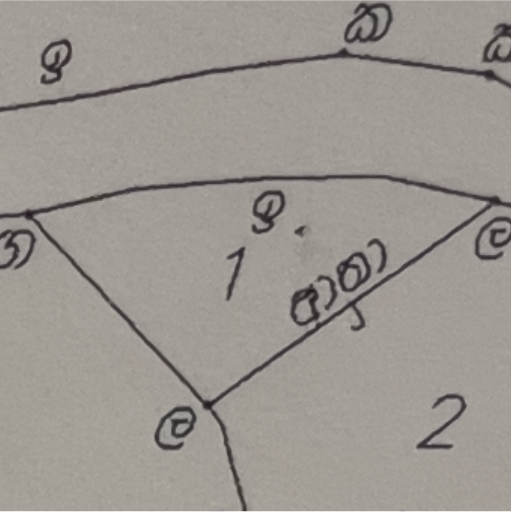

Please update the 'points' variable with your desired points in the code.
Example: points = [(100, 100), (200, 100), (200, 200), (100, 200)]
Skipping mouse selection for Google Colab environment.
Selected points: [(50, 50), (200, 50), (200, 200), (50, 200)]
Displaying the mask:


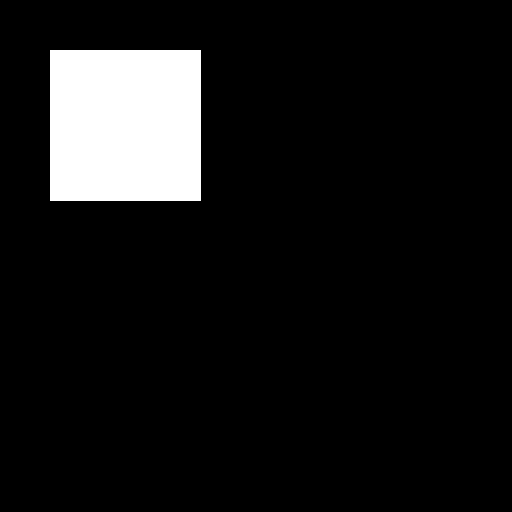

Displaying the selected region:


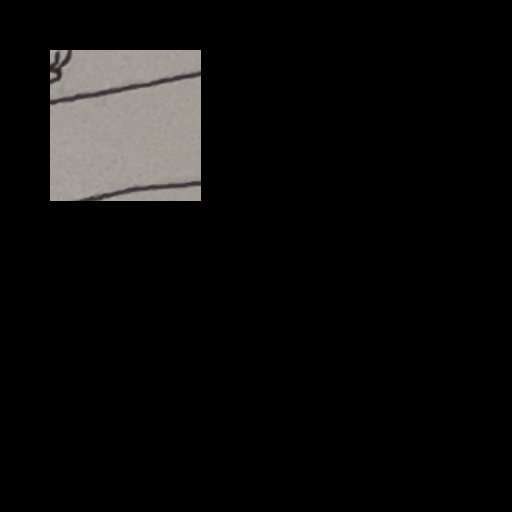

Displaying the final output with polygon boundary:


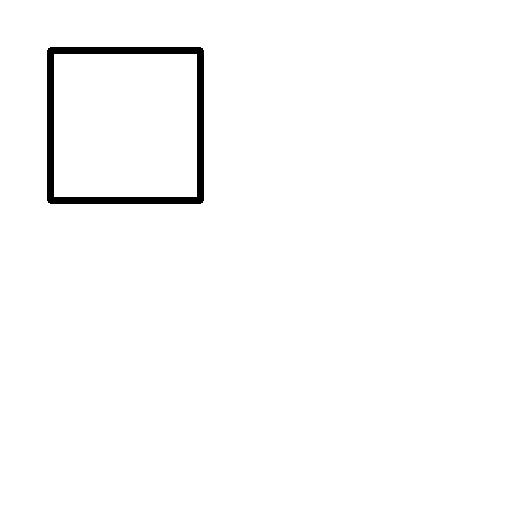

Mask image saved at: /content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/Surveys/MaskOutput/1_mask.png
Final image saved at: /content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/Surveys/FinalOutput/1.png


In [ ]:
import cv2
import numpy as np
import os
from google.colab.patches import cv2_imshow

# Global variables to store the points
points = []

# Helper function to display instructions
def display_instructions():
    print("Please update the 'points' variable with your desired points in the code.")
    print("Example: points = [(100, 100), (200, 100), (200, 200), (100, 200)]")
    print("Skipping mouse selection for Google Colab environment.")

# Load the image
image_path = '/content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/Surveys/Input/image1.png'  # Update with your image path
image = cv2.imread(image_path)

# Check if the image was loaded properly
if image is None:
    print(f"Error: Unable to open image file {image_path}. Check the path and file format.")
else:
    # Resize the image to have width 512px while keeping aspect ratio
    target_width = 512
    height, width = image.shape[:2]
    aspect_ratio = height / width
    target_height = int(target_width * aspect_ratio)
    image = cv2.resize(image, (target_width, target_height))
    image_copy = image.copy()

    # Display the resized image
    print("Displaying the resized image:")
    cv2_imshow(image_copy)

    # Display instructions for manual point input
    display_instructions()

    # Set points manually (replace this with actual points for your use case)
    points = [(50, 50), (200, 50), (200, 200), (50, 200)]  # Example points

    # Ensure at least 3 points are selected to form a polygon
    if len(points) < 3:
        print("At least 3 points are required to form a polygon.")
    else:
        print(f"Selected points: {points}")  # Debugging: print selected points

        # Create a mask for the polygonal region of interest (ROI)
        mask = np.zeros(image.shape[:2], dtype=np.uint8)  # Mask with the same size as the resized image
        points_np = np.array(points, np.int32)  # Convert points to numpy array
        points_np = points_np.reshape((-1, 1, 2))  # Reshape for fillPoly function

        # Fill the polygon on the mask
        cv2.fillPoly(mask, [points_np], 255)  # Fill the polygon with white (255)

        # Debugging: visualize the mask
        print("Displaying the mask:")
        cv2_imshow(mask)

        # Extract the selected region using the mask
        selected_region = cv2.bitwise_and(image, image, mask=mask)

        # Debugging: visualize the selected region
        print("Displaying the selected region:")
        cv2_imshow(selected_region)

        # Create a white background
        white_background = np.ones_like(image) * 255  # White background image

        # Place the selected region onto the white background
        background_with_selection = cv2.bitwise_or(white_background, selected_region)

        # Draw the polygonal boundary on the selected region with a thinner line
        cv2.polylines(background_with_selection, [points_np], isClosed=True, color=(0, 0, 0), thickness=5)

        # Show the final output
        print("Displaying the final output with polygon boundary:")
        cv2_imshow(background_with_selection)

        # Define output paths for mask and final output
        mask_output_path = '/content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/Surveys/MaskOutput/1_mask.png'  # Path for saving the mask
        final_output_path = '/content/drive/MyDrive/Architecture_20250102/Architecture/TestingIMages/Surveys/FinalOutput/1.png'    # Path for saving the final output

        # Save the mask
        cv2.imwrite(mask_output_path, mask)
        print(f"Mask image saved at: {mask_output_path}")

        # Save the final output
        cv2.imwrite(final_output_path, background_with_selection)
        print(f"Final image saved at: {final_output_path}")
